In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None


In [4]:
df = pd.read_csv(r'C:\Users\saket_kcqjbd6\Downloads\archive\movies.csv')

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [14]:
#checking for null columns
import numpy as np

for col in df.columns:
    miss_col = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(miss_col * 100, 2)))


name - 0.0%
rating - 1.0%
genre - 0.0%
year - 0.0%
released - 0.03%
score - 0.04%
votes - 0.04%
director - 0.0%
writer - 0.04%
star - 0.01%
country - 0.04%
budget - 28.31%
gross - 2.46%
company - 0.22%
runtime - 0.05%


In [6]:
print(df.dtypes) #printing schema

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [15]:
# Rows removed where critical columns have missing values
df_cleaned = df.dropna(subset=['budget', 'gross', 'votes'])

# Fill missing values in non-critical columns
df_cleaned['rating'] = df_cleaned['rating'].fillna('Unknown')
df_cleaned['company'] = df_cleaned['company'].fillna('Unknown')
df_cleaned['runtime'] = df_cleaned['runtime'].fillna(df_cleaned['runtime'].mean())  # fills one common value in the vacant spaces of the numeric column
 

In [16]:
# Check for any remaining missing values
print(df_cleaned.isnull().sum())


name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     1
budget      0
gross       0
company     0
runtime     0
dtype: int64


In [17]:
# Convert to integer if needed
df_cleaned['votes'] = df_cleaned['votes'].astype('int64')
df_cleaned['budget'] = df_cleaned['budget'].astype('int64')
df_cleaned['gross'] = df_cleaned['gross'].astype('int64')


In [19]:
print(df_cleaned.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object


In [26]:
df_cleaned

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.000000
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.000000
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.000000
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.000000
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.000000
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.000000
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.000000
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.000000
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.000000
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.000000


In [31]:
1#Drop any duplicates

df_og = df_cleaned.drop_duplicates()

df_og = df_og.sort_values(by = 'gross', ascending = False)

df_og

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.000000
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.000000
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.000000
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.000000
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.000000
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.000000
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.000000
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.000000
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.000000
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.000000


In [34]:
df_og.index.name = 'Index'
print(df_og.head())


                                             name rating   genre  year  \
Index                                                                    
5445                                       Avatar  PG-13  Action  2009   
7445                            Avengers: Endgame  PG-13  Action  2019   
3045                                      Titanic  PG-13   Drama  1997   
6663   Star Wars: Episode VII - The Force Awakens  PG-13  Action  2015   
7244                       Avengers: Infinity War  PG-13  Action  2018   

                                released  score    votes       director  \
Index                                                                     
5445   December 18, 2009 (United States)    7.8  1100000  James Cameron   
7445      April 26, 2019 (United States)    8.4   903000  Anthony Russo   
3045   December 19, 1997 (United States)    7.8  1100000  James Cameron   
6663   December 18, 2015 (United States)    7.8   876000    J.J. Abrams   
7244      April 27, 2018 (Unite

In [ ]:
#correlation

#budget
#company
#genre

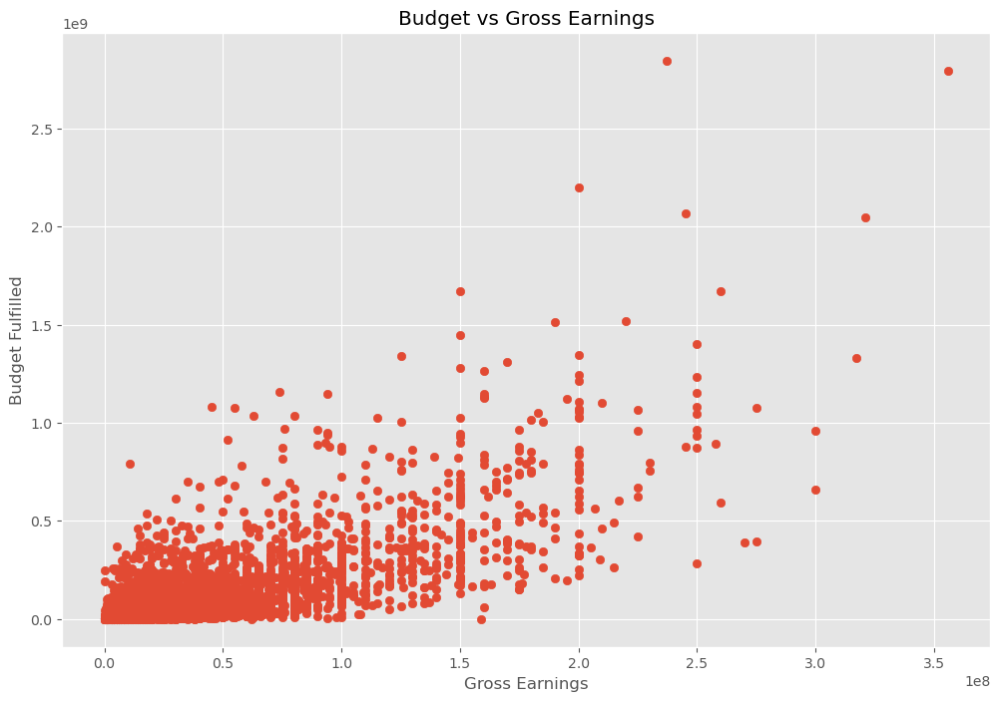

In [38]:
plt.scatter(x = df_og['budget'], y = df_og['gross'])
plt.title('Budget vs Gross Earnings') 

plt.xlabel('Gross Earnings')
plt.ylabel('Budget Fulfilled')
plt.show()

<Axes: xlabel='gross', ylabel='budget'>

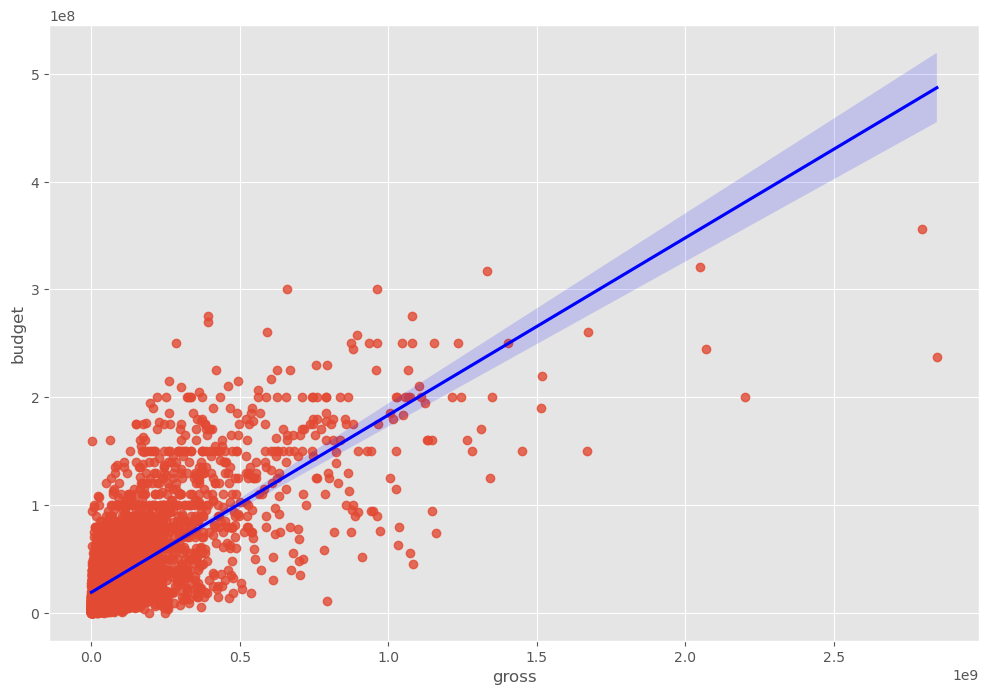

In [40]:
#regression plot to see correlation)

sns.regplot(x="gross", y="budget", data=df_og, line_kws = {"color": "blue"})

In [53]:
# look at correlation
# Select only numeric columns for correlation
numeric_df = df_og.select_dtypes(include=['float64', 'int64'])

# Calculate correlation
correlation_matrix = numeric_df.corr(method = 'kendall')

# Display the correlation matrix
print(correlation_matrix)

#types of correlation: pearson, kendall, spearman

             year     score     votes    budget     gross   runtime
year     1.000000  0.038391  0.295884  0.220991  0.239313  0.064148
score    0.038391  1.000000  0.350111 -0.006518  0.124715  0.292761
votes    0.295884  0.350111  1.000000  0.346228  0.553640  0.205601
budget   0.220991 -0.006518  0.346228  1.000000  0.512637  0.230890
gross    0.239313  0.124715  0.553640  0.512637  1.000000  0.176830
runtime  0.064148  0.292761  0.205601  0.230890  0.176830  1.000000


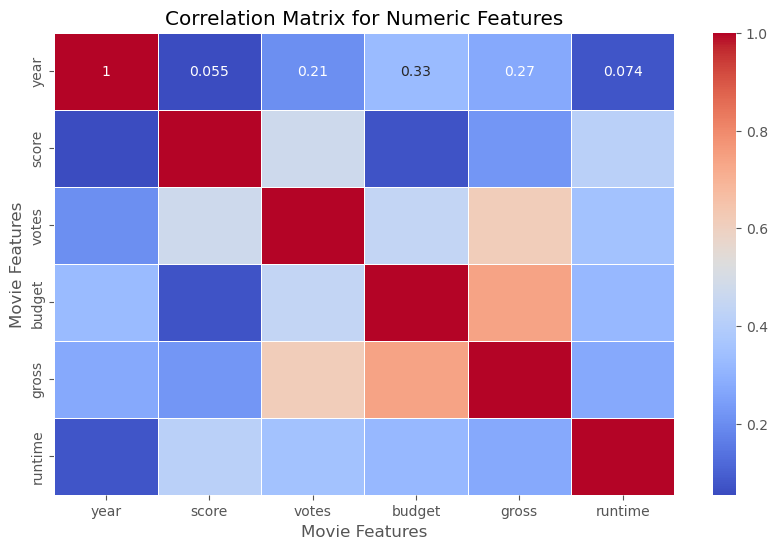

In [55]:

# Plot a Heatmap of the Correlation Matrix, visualize the correlations for better interpretation
correlation_matrix = numeric_df.corr(method = 'pearson')
plt.figure(figsize=(10, 6))

# Create a heatmap for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Display the heatmap
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()




In [ ]:
# High correlation between budget and gross
# Moderate correlation between gross and votes

In [57]:
# Convert company column to numeral for correlation

df_numerised = df_og

for col_name in df_numerised.columns:
    if(df_numerised[col_name].dtype == 'object'):
        df_numerised[col_name]= df_numerised[col_name].astype('category')
        df_numerised[col_name]= df_numerised[col_name].cat.codes #gives random numerals 

df_numerised

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
Index,,,,,,,,,,,,,,,
5445,387,5,0,2009,528,7.8,1100000,787,1265,1538,47,237000000,2847246203,1388,162.000000
7445,389,5,0,2019,138,8.4,903000,106,515,1474,47,356000000,2797501328,987,181.000000
3045,4923,5,6,1997,535,7.8,1100000,787,1265,1076,47,200000000,2201647264,1388,194.000000
6663,3656,5,0,2015,530,7.8,876000,770,1810,357,47,245000000,2069521700,949,138.000000
7244,390,5,0,2018,146,8.4,897000,106,515,1474,47,321000000,2048359754,987,149.000000
7480,4402,4,2,2019,1130,6.9,222000,1014,1364,458,47,260000000,1670727580,1430,118.000000
6653,2125,5,0,2015,1307,7.0,593000,337,2530,294,47,150000000,1670516444,1403,124.000000
6043,3891,5,0,2012,1905,8.0,1300000,1062,1650,1474,47,220000000,1518815515,987,143.000000
6646,1545,5,0,2015,166,7.1,370000,811,483,1792,47,190000000,1515341399,1403,137.000000


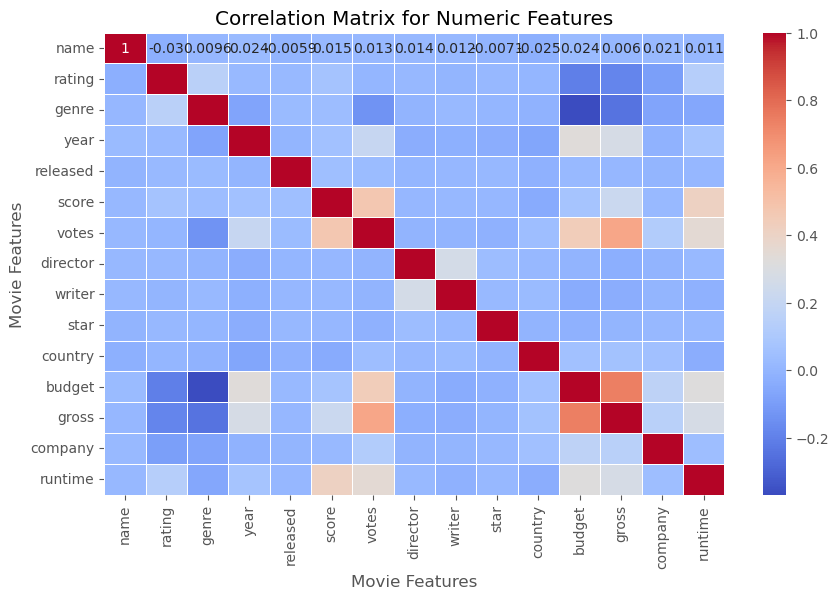

In [60]:
# Plot a Heatmap of the Correlation Matrix, visualize the correlations for better interpretation
correlation_matrix = df_numerised.corr(method = 'pearson')
plt.figure(figsize=(10, 6))

# Create a heatmap for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Display the heatmap
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()



In [ ]:
# moderate correlation in runtime and score

In [61]:
df_numerised.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.029987,0.009617,0.024435,-0.005896,0.014955,0.012915,0.013699,0.011602,-0.007109,-0.024555,0.023698,0.005966,0.021347,0.010800
rating,-0.029987,1.000000,0.152486,0.016474,0.017126,0.068304,0.003942,0.014081,-0.000861,0.011267,0.001319,-0.205920,-0.182403,-0.095558,0.137226
genre,0.009617,0.152486,1.000000,-0.073026,0.021712,0.034061,-0.136457,-0.009303,0.017500,0.002619,-0.010847,-0.368900,-0.244380,-0.072835,-0.060177
year,0.024435,0.016474,-0.073026,1.000000,-0.001481,0.055174,0.205758,-0.036936,-0.024568,-0.032770,-0.066662,0.327781,0.274264,-0.014774,0.074196
released,-0.005896,0.017126,0.021712,-0.001481,1.000000,0.046424,0.029029,0.003341,0.008514,0.015363,-0.017231,0.019888,0.008614,-0.002689,0.008619
score,0.014955,0.068304,0.034061,0.055174,0.046424,1.000000,0.473809,0.005573,0.012860,0.009121,-0.044690,0.071792,0.222143,0.020168,0.414530
votes,0.012915,0.003942,-0.136457,0.205758,0.029029,0.473809,1.000000,-0.010198,-0.005394,-0.017140,0.042146,0.440021,0.614904,0.118731,0.352432
director,0.013699,0.014081,-0.009303,-0.036936,0.003341,0.005573,-0.010198,1.000000,0.262940,0.036289,0.011108,-0.009340,-0.029366,-0.006616,0.018082
writer,0.011602,-0.000861,0.017500,-0.024568,0.008514,0.012860,-0.005394,0.262940,1.000000,0.019273,0.022153,-0.039420,-0.035999,-0.003289,-0.016670
star,-0.007109,0.011267,0.002619,-0.032770,0.015363,0.009121,-0.017140,0.036289,0.019273,1.000000,-0.010135,-0.021282,-0.000009,0.013716,0.012439


In [62]:
corr_mat = df_numerised.corr()

corr_pairs = corr_mat.unstack()
#pairs- comparison with each feature 
corr_pairs

name      name        1.000000
          rating     -0.029987
          genre       0.009617
          year        0.024435
          released   -0.005896
          score       0.014955
          votes       0.012915
          director    0.013699
          writer      0.011602
          star       -0.007109
          country    -0.024555
          budget      0.023698
          gross       0.005966
          company     0.021347
          runtime     0.010800
rating    name       -0.029987
          rating      1.000000
          genre       0.152486
          year        0.016474
          released    0.017126
          score       0.068304
          votes       0.003942
          director    0.014081
          writer     -0.000861
          star        0.011267
          country     0.001319
          budget     -0.205920
          gross      -0.182403
          company    -0.095558
          runtime     0.137226
genre     name        0.009617
          rating      0.152486
        

In [64]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.368900
budget    genre      -0.368900
gross     genre      -0.244380
genre     gross      -0.244380
rating    budget     -0.205920
budget    rating     -0.205920
gross     rating     -0.182403
rating    gross      -0.182403
genre     votes      -0.136457
votes     genre      -0.136457
company   rating     -0.095558
rating    company    -0.095558
year      genre      -0.073026
genre     year       -0.073026
          company    -0.072835
company   genre      -0.072835
country   year       -0.066662
year      country    -0.066662
genre     runtime    -0.060177
runtime   genre      -0.060177
country   score      -0.044690
score     country    -0.044690
budget    writer     -0.039420
writer    budget     -0.039420
director  year       -0.036936
year      director   -0.036936
writer    gross      -0.035999
gross     writer     -0.035999
runtime   country    -0.033554
country   runtime    -0.033554
year      star       -0.032770
star      year       -0.032770
rating  

In [68]:
#pairs with high correlation

high_corr = sorted_pairs[(sorted_pairs)>0.4 ]
high_corr

runtime   score       0.414530
score     runtime     0.414530
budget    votes       0.440021
votes     budget      0.440021
score     votes       0.473809
votes     score       0.473809
gross     votes       0.614904
votes     gross       0.614904
gross     budget      0.740395
budget    gross       0.740395
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [ ]:
# budget & gross, votes and gross, votes & score, budget & votes, runtime & score

<Axes: xlabel='gross', ylabel='budget'>

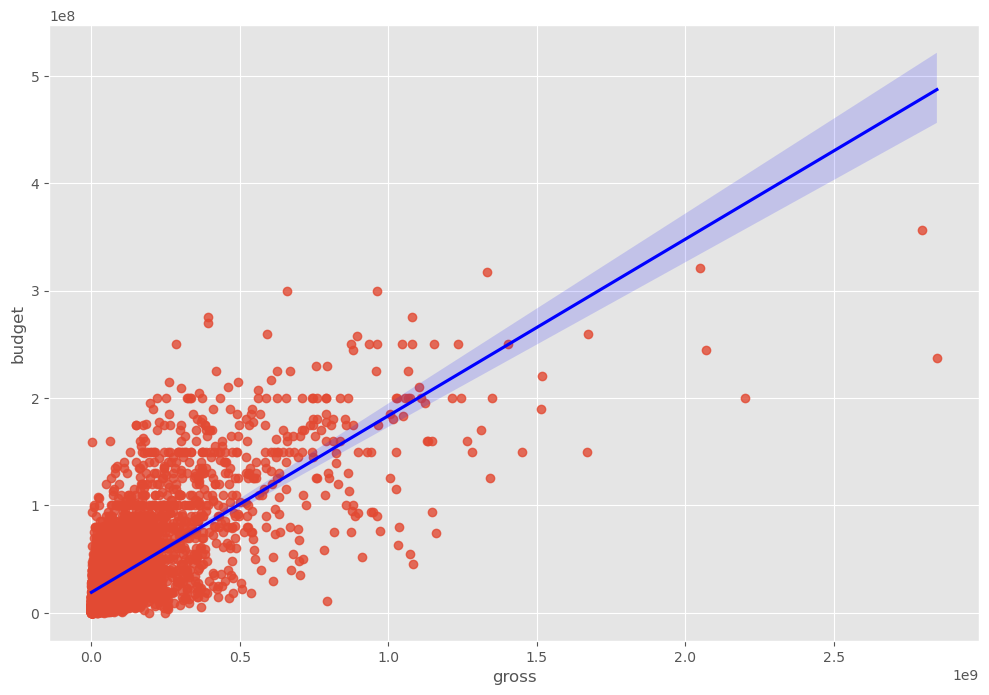

In [72]:

sns.regplot(x="gross", y="budget", data=df_og, line_kws = {"color": "blue"})


<Axes: xlabel='votes', ylabel='gross'>

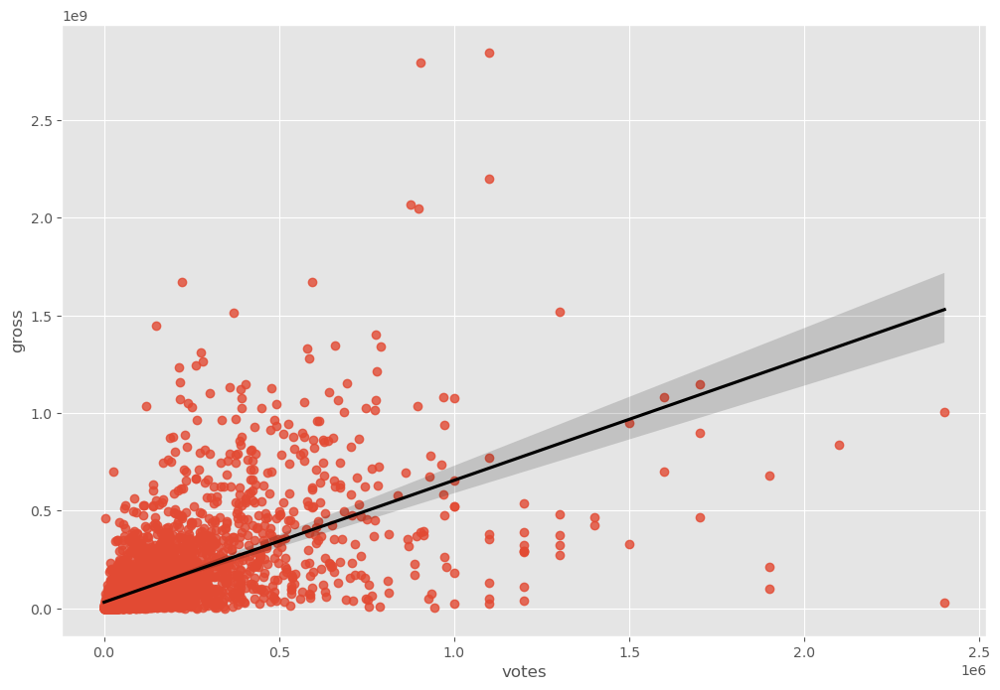

In [73]:
sns.regplot(x="votes", y="gross", data=df_og, line_kws = {"color": "black"})


<Axes: xlabel='score', ylabel='votes'>

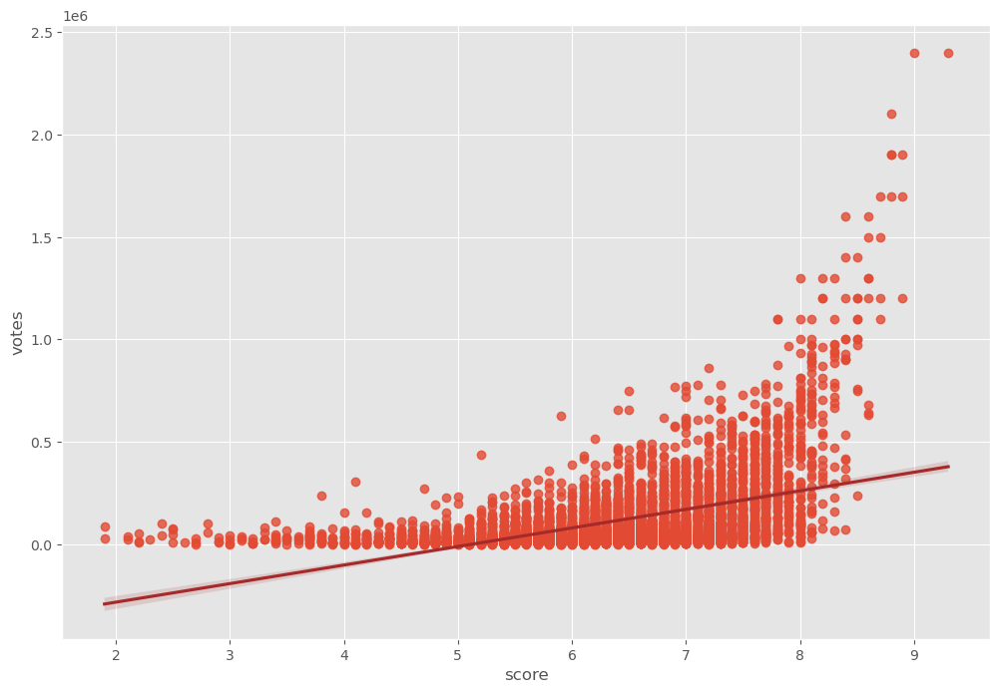

In [74]:
sns.regplot(x="score", y="votes", data=df_og, line_kws = {"color": "brown"})

<Axes: xlabel='runtime', ylabel='score'>

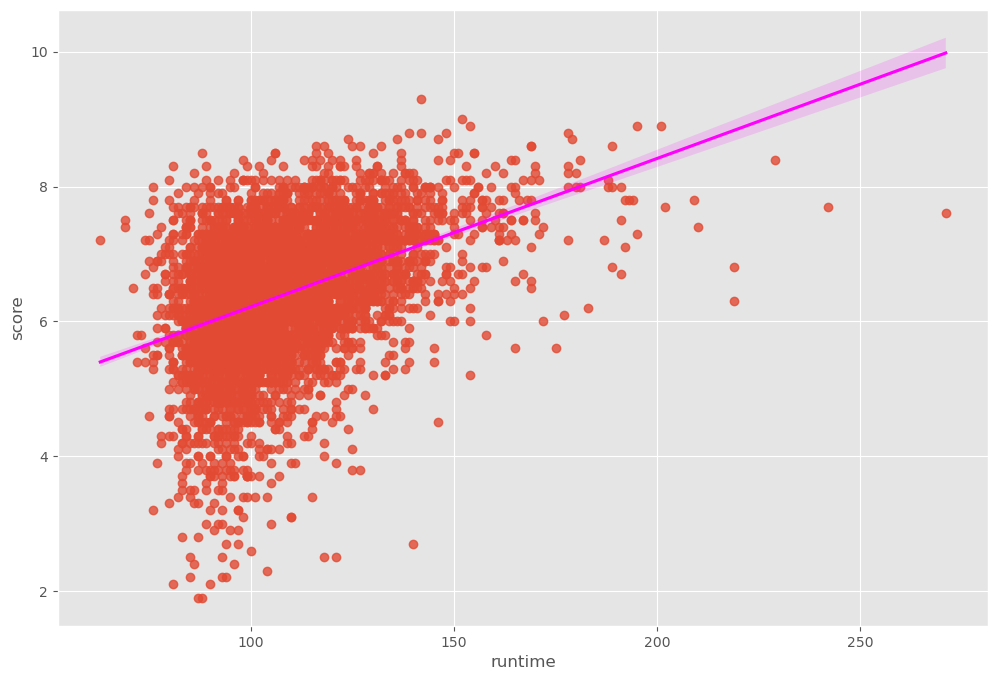

In [76]:

sns.regplot(x="runtime", y="score", data=df_og, line_kws = {"color": "magenta"})

In [79]:
import os
notebook_path = os.path.abspath("correlation movies project")
print(notebook_path)

C:\Users\saket_kcqjbd6\correlation movies project
